In [1]:
import os
import datetime
import numpy as np
import pandas as pd
import altair as alt
from altair.expr import datum, if_

In [2]:
# we need to run this line to use Altair in a Jupyter notebook
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

In [3]:
# Altair raises a MaxRowsError exception when passing a dataset with more than 5000 rows.
ALTAIR_LIMIT = 5000
# The limit of 5000 rows can be disabled with this line
# https://altair-viz.github.io/user_guide/faq.html#maxrowserror-how-can-i-plot-large-datasets
alt.data_transformers.enable('default', max_rows=None)

DataTransformerRegistry.enable('default')

## Data

In [4]:
excel_files = [
    'claims-2002-2006_0.xls',
    'claims-2007-2009_0.xls',
    'claims-2010-2013_0.xls',
    'claims-2014.xls',
    'claims-data-2015-as-of-feb-9-2016.xlsx'
]

In [5]:
def harmonize_df(df):
    columns = {
        'Item Category': 'item',
        'Item': 'item',
        'Incident D': 'incident_date',
        'Incident Date': 'incident_date',
        'Close Amount': 'close_amount',
        'Date Received': 'date_received', 
        'Airport Code': 'airport_code', 
        'Airport Name': 'airport_name',
        'Airline Name': 'airline_name',
        'Claim Type': 'claim_type',
        'Claim Site': 'claim_site',
        'Disposition': 'disposition'
    }
    df.rename(columns=columns, inplace=True)
    columns_to_drop = ['Claim Number', 'Claim Amount', 'Status']
    columns_available_to_drop = list(set(df.columns.values).intersection(set(columns_to_drop)))
    df.drop(columns=columns_available_to_drop, inplace=True)
    return df

In [11]:
def make_df_from_excel(file_name, nrows=5000):
    """Read from an Excel file in chunks and make a single DataFrame."""
    file_path = os.path.abspath(os.path.join('data', file_name))
    xl = pd.ExcelFile(file_path)
    sheetname = xl.sheet_names[0]    
    df_header = pd.read_excel(file_path, sheetname=sheetname, nrows=1)
    
    chunks = []    
    i_chunk = 0
    skiprows = 1
    while True:
        df_chunk = pd.read_excel(file_path, sheetname=sheetname, nrows=nrows, skiprows=skiprows, header=None)
        skiprows += nrows
        if not df_chunk.shape[0]:
            break
        else:
            print(f"{file_name}, chunk {i_chunk} ({df_chunk.shape[0]} rows)")
            chunks.append(df_chunk)
        i_chunk += 1
    
    df_chunks = pd.concat(chunks)
    # We need to rename the columns, otherwise we cannot concatenate the chunks with the header.
    columns = {i: col for i, col in enumerate(df_header.columns.tolist())}    
    df_chunks.rename(columns=columns, inplace=True)
    df_raw = pd.concat([df_header, df_chunks])
    df = harmonize_df(df_raw)
    return df

In [12]:
# def make_df_from_excel(file_name, harmonize=True):
#     file_path = os.path.abspath(os.path.join('data', file_name))
#     xl = pd.ExcelFile(file_path)
#     if harmonize:
# #         df = harmonize_df(pd.read_excel(file_path, sheetname=xl.sheet_names[0], nrows=500))
#         df = harmonize_df(pd.read_excel(file_path, sheetname=xl.sheet_names[0]))
#     else:
#         df = pd.read_excel(file_path, sheetname=xl.sheet_names[0])
#     return df

In [13]:
def clean_df(df):
    # drop problematic records (e.g. dates with incorrect datatype)
    ii = set(range(df.shape[0]))
    ii_invalid = set([i for i, x in enumerate(df['incident_date']) if isinstance(x, str) or pd.isnull(x)])
    ii_valid = list(ii.difference(ii_invalid))
    ddf = df.iloc[ii_valid].reset_index()
    ddf.set_index('index', inplace=True)
    ddf['incident_date'].astype('str')
    ddf['incident_date'].apply(lambda x: datetime.datetime(year=x.year, month=x.month, day=x.day))
    
    # assign NaN where no data is available
    ddf.replace(to_replace='-', value=np.nan, inplace=True)    
    return ddf

In [14]:
%%time
dataframes = [make_df_from_excel(file_name) for file_name in excel_files]
print(f"{len(dataframes)} dataframe/s")

/home/giacomo/.virtualenvs/reddit-dataviz-battle-2018-08--PKZPjQZ/lib/python3.6/site-packages/pandas/io/excel.py:329: FutureWarning: The `sheetname` keyword is deprecated, use `sheet_name` instead
  **kwds)


claims-2014.xls, chunk 0 (5000 rows)
claims-2014.xls, chunk 1 (3855 rows)
1 dataframe/s
CPU times: user 5.98 s, sys: 342 µs, total: 5.98 s
Wall time: 5.98 s


In [16]:
df = clean_df(pd.concat(dataframes)).reset_index().drop(columns=['index'])
df.sample(n=5)

,date_received,incident_date,airport_code,airport_name,airline_name,claim_type,claim_site,item,close_amount,disposition
4958,2014-07-15,2014-05-29 17:50:00,MIA,Miami International Airport,TAP Portugal,Passenger Property Loss,Checked Baggage,Cosmetics & Grooming,NaN,NaN
3029,2014-04-24,2014-04-19 20:00:00,ATL,Hartsfield-Jackson Atlanta International Airport,Delta Air Lines,Passenger Property Loss,Checked Baggage,Travel Accessories,38.0,Approve in Full
5868,2014-08-20,2014-06-30 21:30:00,JFK,John F. Kennedy International,EL AL Israeli Airlines,Property Damage,Checkpoint,NaN,NaN,NaN
3326,2014-05-06,2014-05-01 10:00:00,OMA,Eppley Airfield,American Airlines,Passenger Property Loss,Checked Baggage,Sporting Equipment & Supplies,0.0,Deny
6627,2014-09-16,2014-09-05 00:00:00,LAS,McCarran International,Southwest Airlines,Property Damage,Checked Baggage,Baggage/Cases/Purses,0.0,Deny


The only quantitative variable is `close_amount`.

In [17]:
# df.describe(include='all')  # include all types of variables
df.describe()

,close_amount
count,5119.000000
mean,105.243116
std,517.587122
min,0.000000
25%,0.000000
50%,0.000000
75%,90.000000
max,25483.440000


Many occurrences of `close_amount` are `0`. Actually, it's the majority: denying a claim is the most frequent disposition.

In [18]:
df_zero = df[df['close_amount'] == 0]
df_zero.shape

(2759, 10)

It makes sense. Whenever the `Disposition` is to `Deny` the claim, `Claim Amount` is `0`.

In [19]:
df_zero.disposition.unique()

array(['Deny'], dtype=object)

In [20]:
df_zero.head()

,date_received,incident_date,airport_code,airport_name,airline_name,claim_type,claim_site,item,close_amount,disposition
0,2014-01-13,2012-12-21 00:00:00,HPN,"Westchester County, White Plains",USAir,Personal Injury,Checked Baggage,Audio/Video; Jewelry & Watches,0.0,Deny
1,2014-01-13,2012-12-21 00:00:00,HPN,"Westchester County, White Plains",USAir,Personal Injury,Checked Baggage,Audio/Video; Jewelry & Watches,0.0,Deny
2,2014-07-17,2014-06-30 18:38:00,MCO,Orlando International Airport,Delta Air Lines,Property Damage,Checked Baggage,NaN,0.0,Deny
4,2014-01-07,2014-01-02 00:00:00,IAD,Washington Dulles International,UAL,Property Damage,Checked Baggage,Baggage/Cases/Purses,0.0,Deny
5,2014-01-09,2014-01-07 00:00:00,SAT,San Antonio International,Southwest Airlines,Property Damage,Checked Baggage,Computer & Accessories,0.0,Deny


There seem to be a few very high values. We could say that if a value if `Claim Amount` is higher than 99.9% of the values, it's an *outlier*.

In [21]:
ca = df['close_amount']
outlier_threshold = ca.quantile(.999)
outlier_threshold

2427.1126800000156

In [22]:
df_outliers = df[ca >= ca.quantile(.999)]
df_outliers.shape

(6, 10)

In [23]:
df_outliers.head()

,date_received,incident_date,airport_code,airport_name,airline_name,claim_type,claim_site,item,close_amount,disposition
94,2014-04-24,2013-08-02 00:00:00,ZZX,Non TSA Airport (motor vehicle),NaN,Personal Injury,Motor Vehicle,NaN,20000.00,Settle
921,2014-02-03,2013-09-09 00:00:00,SMF,Sacramento International Airport,NaN,Property Damage,Checkpoint,Other,6183.36,Approve in Full
4371,2014-06-27,2013-12-01 20:15:00,FWA,Ft. Wayne Municipal- Baer Field,NaN,Property Damage,Checkpoint,NaN,25483.44,Settle
5188,2014-07-22,2014-07-09 06:22:00,ORD,Chicago O'Hare International Airport,Spirit Airlines,Property Damage,Checkpoint,Computer & Accessories,2430.74,Settle
6016,2014-08-18,2014-07-14 00:00:00,EWR,Newark International Airport,UAL,Property Damage,Checked Baggage,Sporting Equipment & Supplies,2500.00,Settle


I am not sure what `ZZX` is. A motor vehicle? It's not an airport code...

Anyway, there are a few of them...

In [24]:
df_zzx = df[df['airport_code'] == 'ZZX']
df_zzx.shape

(36, 10)

...and they have a much higher `close_amount`.

In [25]:
df_zzx.describe()

,close_amount
count,13.000000
mean,2845.928462
std,5320.521575
min,0.000000
25%,630.000000
50%,1003.130000
75%,2128.290000
max,20000.000000


In [26]:
df_not_zzx = df[df['airport_code'] != 'ZZX']
df_not_zzx.describe()

,close_amount
count,5106.000000
mean,98.265264
std,427.621781
min,0.000000
25%,0.000000
50%,0.000000
75%,89.997500
max,25483.440000


Let's try to analyze the `close_amount` distribution in a range of values between `0` and `outlier_threshold` (both excluded).

In [27]:
df_in_range = df[(ca > 0) & (ca < outlier_threshold)]
df_in_range.shape

(2354, 10)

In [28]:
# df_in_range.drop(columns=['incident_date'], inplace=True)

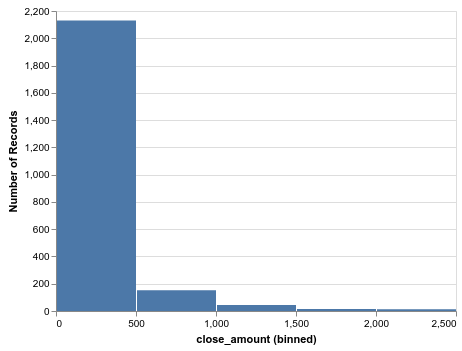

In [29]:
alt.Chart(df_in_range).mark_bar()\
.encode(
    x=alt.X("close_amount", bin=True),
    y='count()'
)

When creating a histogram, it's important to try different bin sizes.

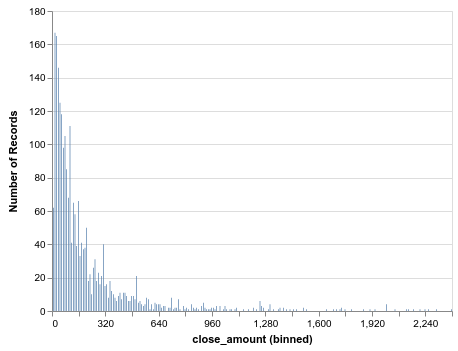

In [30]:
alt.Chart(df_in_range).mark_bar()\
.encode(
    x=alt.X("close_amount", bin=alt.BinParams(step=10, nice=True)),
    y='count()',
)

A (relatively) small number of high values cause the histogram to spread too much.

Let's try to plot the records where `close_amount` is between 0 and the 95th percentile.

In [31]:
ca = df['close_amount']
df95 = df[(ca > 0) & (ca <= ca.quantile(.95))]
df95.shape

(2104, 10)

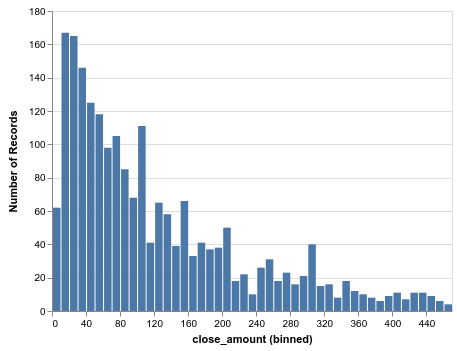

In [32]:
alt.Chart(df95).mark_bar()\
.encode(
    x=alt.X('close_amount', bin=alt.BinParams(step=10, nice=True)),
    y='count()',
)

In [33]:
df.shape

(8856, 10)

In [34]:
df_not_na = df.dropna(subset=['claim_type', 'close_amount', 'disposition'])
df_not_na.shape

(5110, 10)

In [35]:
claim_types = df_not_na['claim_type'].unique().tolist()

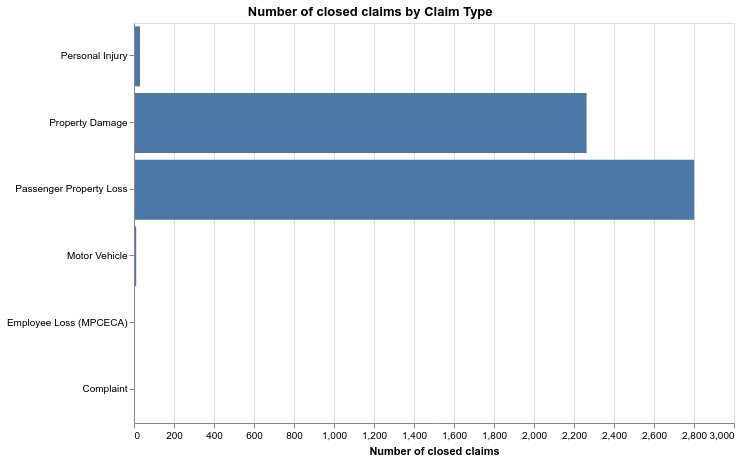

In [36]:
# Q is a shorthand to declare a Quantitative datatype in Altair
alt.Chart(df_not_na).mark_bar()\
.encode(
    x=alt.X('count(*):Q', axis=alt.Axis(title='Number of closed claims')),
    y=alt.Y('claim_type', sort=claim_types, axis=alt.Axis(title=''))
)\
.properties(
    title='Number of closed claims by Claim Type',
    width=600,
    height=400
)

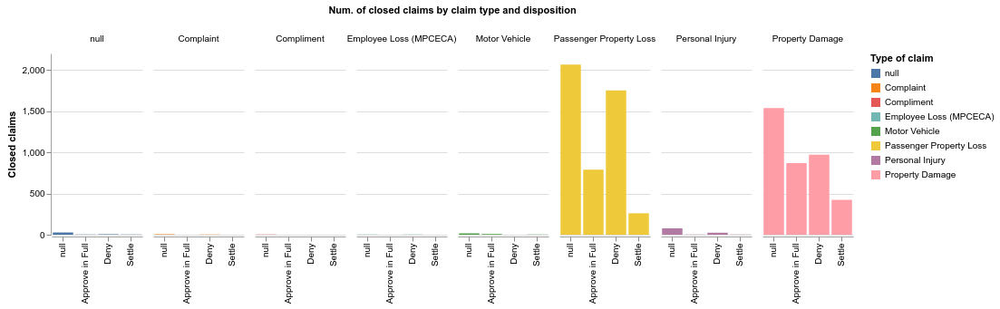

In [37]:
alt.Chart(df).mark_bar(stroke='transparent')\
.encode(
    x=alt.X('disposition', axis=alt.Axis(title='')),
    y=alt.Y('count(*):Q', axis=alt.Axis(title='Closed claims', grid=True)),    
    color=alt.Color('claim_type', title='Type of claim'),
    column=alt.Column('claim_type', title='Num. of closed claims by claim type and disposition'),
).configure_view(
    stroke='transparent'
).configure_axis(
    domainWidth=0.8,
    # ticks=False
).properties(width=100, height=200)

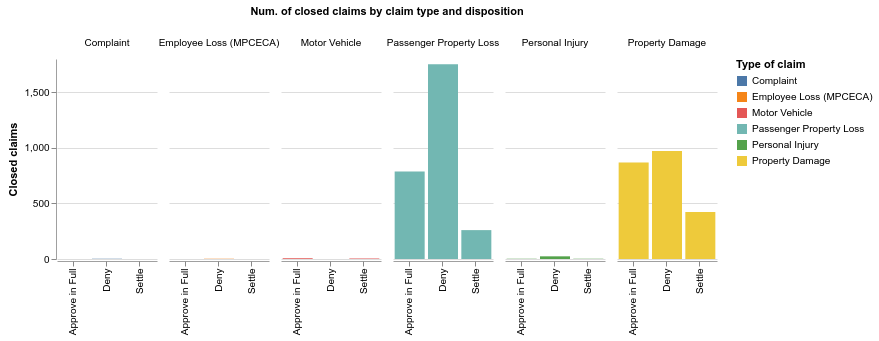

In [38]:
alt.Chart(df_not_na).mark_bar(stroke='transparent')\
.encode(
    x=alt.X('disposition', axis=alt.Axis(title='')),
    y=alt.Y('count(*):Q', axis=alt.Axis(title='Closed claims', grid=True)),    
    color=alt.Color('claim_type', title='Type of claim'),
    column=alt.Column('claim_type', title='Num. of closed claims by claim type and disposition'),
).configure_view(
    stroke='transparent'
).configure_axis(
    domainWidth=0.8,
    # ticks=False
).properties(width=100, height=200)

[MPCECA](https://www.law.cornell.edu/cfr/text/29/15.200)

In [39]:
# line = alt.Chart(df_low).mark_line().encode(
#     x=alt.X('Date Received', axis=alt.Axis(title='ddd')),
#     y='Close Amount',
#     color='Claim Type'
# ).properties(
#     width=600,
#     title="Daily closing prices with their aggregate prices"
# ).interactive(bind_y=False)

# rule = alt.Chart(df_low).mark_rule().encode(
#     alt.Y('median(Close Amount):Q'),
#     size=alt.value(2),
#     color='Claim Type'
# )

# line + rule

In [40]:
def make_years_df(df, date_col, other_col, agg):
    assert date_col in ['date_received', 'incident_date']
    assert agg in ['count', 'sum']
    
    df_time_indexed = df.set_index(df[date_col])
    dg = df_time_indexed[[date_col, other_col]]\
      .groupby(pd.Grouper(key=date_col, freq='1D'))\
      .agg(agg)
    
    ddf = dg.reset_index()
    ddf.rename(columns={date_col: 'date', other_col: 'value'}, inplace=True)
    ddf['type'] = other_col
    return ddf

In [41]:
date_col = 'date_received'
df_disposition = make_years_df(df, date_col, 'disposition', agg='count')
df_claim_type = make_years_df(df, date_col, 'claim_type', agg='count')
df_close_amount = make_years_df(df, date_col, 'close_amount', agg='sum')
n = 3
pd.concat([df_disposition.head(n), df_claim_type.head(n), df_close_amount.head(n)])

,date,value,type
0,2014-01-01,1.00,disposition
1,2014-01-02,49.00,disposition
2,2014-01-03,29.00,disposition
0,2014-01-01,1.00,claim_type
1,2014-01-02,59.00,claim_type
2,2014-01-03,31.00,claim_type
0,2014-01-01,0.00,close_amount
1,2014-01-02,5536.92,close_amount
2,2014-01-03,3672.99,close_amount


In [42]:
def make_final_df(dataframes):
    """Group a DataFrame by time period.
    
    See Also:
        https://docs.python.org/2/library/time.html
    """
    date_col = 'date'
    df_concatenated = pd.concat(dataframes, axis=0)
    df_time_indexed = df_concatenated.set_index(df_concatenated[date_col])
    df_time_indexed.drop(columns=['date'], inplace=True)
    
    df_time_indexed['year'] = df_time_indexed.index.strftime('%Y')
    df_time_indexed['month_human'] = df_time_indexed.index.strftime('%b')
    df_time_indexed['month_number'] = df_time_indexed.index.strftime('%m')
    df_time_indexed['day_of_year'] = df_time_indexed.index.strftime('%j')
    df_time_indexed['weekday_human'] = df_time_indexed.index.strftime('%a')
    df_time_indexed['weekday_number'] = df_time_indexed.index.strftime('%w')
    
    df = df_time_indexed.reset_index().drop(columns=['date'])
    
    def assign_type(input_type):
        if input_type == 'claim_type':
            output_type = 'claim'
        else:
            output_type = input_type
            
        return output_type
    
    df['type'] = [assign_type(r['type']) for i,r in df.iterrows()]
    return df

In [43]:
df_final = make_final_df([df_disposition, df_claim_type, df_close_amount])
print(df_final.shape)
df_final.describe()

(1095, 8)


,value
count,1095.000000
mean,504.729233
std,1535.722933
min,0.000000
25%,4.000000
50%,25.860000
75%,67.000000
max,28406.250000


In [44]:
weekdays = ['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat']
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
years = df_final.year.unique().tolist()

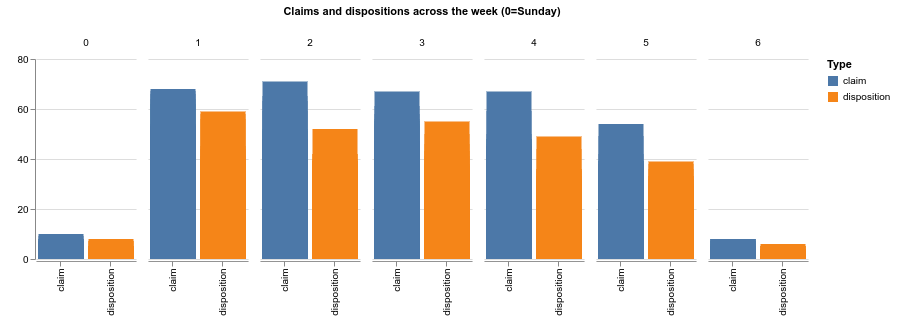

In [45]:
alt.Chart(df_final).mark_bar(stroke='transparent')\
.encode(
    x=alt.X('type', axis=alt.Axis(title='')),
    y=alt.Y('value', axis=alt.Axis(title='', grid=True)),
    color=alt.Color('type', title='Type'),
    column=alt.Column('weekday_number', title='Claims and dispositions across the week (0=Sunday)'),
)\
.transform_filter(datum.type != 'close_amount')\
.configure_view(
    stroke='transparent'
).configure_axisX(
    domainWidth=0.8
).properties(width=100, height=200)

In [46]:
def make_hcc(row_of_charts):
    hconcat = [chart for chart in row_of_charts]
    hcc = alt.HConcatChart(hconcat=hconcat)
    return hcc

In [47]:
def facet_wrap(charts, charts_per_row):
    rows_of_charts = [charts[i:i+charts_per_row] for i in range(0, len(charts), charts_per_row)]
    vconcat = [make_hcc(r) for r in rows_of_charts]    
    vcc = alt.VConcatChart(vconcat=vconcat).configure_axisX(grid=False).configure_axisY(grid=True)
    return vcc

In [48]:
def make_chart(base_chart, year):
    chart = base_chart\
      .transform_filter(datum.year == year)\
      .properties(width=150, height=150, title=year)
    return chart

In [49]:
grouped_disposition = df_final[df_final['type'] == 'disposition']\
  .groupby(by=['year', 'month_human'])[['value']]\
  .sum()

grouped_claim = df_final[df_final['type'] == 'claim']\
  .groupby(by=['year', 'month_human'])[['value']]\
  .sum()

bottom = 0
top = max([grouped_disposition.value.max(), grouped_claim.value.max()])
top

903.0

In [50]:
df_final.sample(n=5)

,value,type,year,month_human,month_number,day_of_year,weekday_human,weekday_number
910,3217.79,close_amount,2014,Jun,06,181,Mon,1
625,32.00,claim,2014,Sep,09,261,Thu,4
466,2.00,claim,2014,Apr,04,102,Sat,6
31,4.00,disposition,2014,Feb,02,032,Sat,6
851,3642.40,close_amount,2014,May,05,122,Fri,5


In [51]:
base_chart = alt.Chart(df_final).mark_line()\
.encode(
    x=alt.X('month_human', sort=months, axis=alt.Axis(title='')),
    y=alt.Y('sum(value):Q', axis=alt.Axis(title=''), scale=alt.Scale(domain=(bottom, top))),
    color=alt.Color('type', title='Type'),
    order='month_number'
)\
.transform_filter(datum.type != 'close_amount')

In [52]:
charts = [make_chart(base_chart, year) for year in years]
len(charts)

1

In [53]:
# base_chart = alt.Chart(df_final).mark_line()\
# .encode(
#     x=alt.X('month_human', sort=months, axis=alt.Axis(title='')),
#     y=alt.Y('sum(value):Q', axis=alt.Axis(title='')),
#     color=alt.Color('type', title='Type'),
#     order='month_number'
# )\
# .transform_filter(datum.year == '2010')\
# .transform_filter(datum.type != 'close_amount')
# base_chart

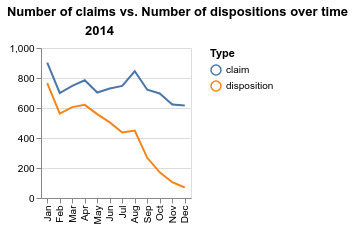

In [54]:
compound_chart = facet_wrap(charts, charts_per_row=4)
compound_chart.properties(title='Number of claims vs. Number of dispositions over time')

In [55]:
grouped_close_amount = df_final[df_final['type'] == 'close_amount']\
  .groupby(by=['year', 'month_human'])[['value']]\
  .sum()

top = grouped_close_amount.value.max()
bottom = 0

In [56]:
base_chart2 = alt.Chart(df_final).mark_line(clip=True)\
.encode(
    x=alt.X('month_human', sort=months, axis=alt.Axis(title='')),
    y=alt.Y('sum(value):Q', axis=alt.Axis(title=''), scale=alt.Scale(domain=(bottom, top))),
    color=alt.Color('type', title='Type', legend=None),
    order='month_number'
)\
.transform_filter(datum.type == 'close_amount')

In [59]:
# dt0 = pd.datetime(year=2002, month=12, day=31)
# dt1 = pd.datetime(year=2007, month=1, day=1)
# date_col = 'date_received'
# df[(dt0 < df[date_col]) & (df[date_col] < dt1)]

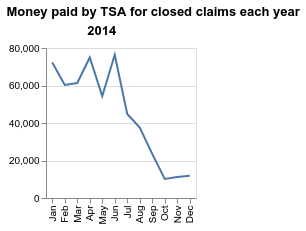

In [58]:
charts = [make_chart(base_chart2, year) for year in years]
compound_chart = facet_wrap(charts, charts_per_row=4)
compound_chart.properties(title='Money paid by TSA for closed claims each year')